In [4]:
import cv2
import numpy as np

# Function to perform nearest-neighbor zooming
def nearest_neighbor_zoom(image, scale_factor):
    height, width = image.shape
    new_height = int(height * scale_factor)
    new_width = int(width * scale_factor)
    zoomed_image = np.zeros((new_height, new_width), dtype=np.uint8)
    
    for i in range(new_height):
        for j in range(new_width):
            orig_i = int(i / scale_factor)
            orig_j = int(j / scale_factor)
            zoomed_image[i, j] = image[orig_i, orig_j]
    
    return zoomed_image

# Function to perform bilinear interpolation zooming
def bilinear_zoom(image, scale_factor):
    height, width = image.shape
    new_height = int(height * scale_factor)
    new_width = int(width * scale_factor)
    zoomed_image = np.zeros((new_height, new_width), dtype=np.uint8)
    
    for i in range(new_height):
        for j in range(new_width):
            orig_i = i / scale_factor
            orig_j = j / scale_factor
            floor_i = int(orig_i)
            floor_j = int(orig_j)
            ceil_i = min(floor_i + 1, height - 1)
            ceil_j = min(floor_j + 1, width - 1)
            
            alpha = orig_i - floor_i
            beta = orig_j - floor_j
            
            top_left = image[floor_i, floor_j]
            top_right = image[floor_i, ceil_j]
            bottom_left = image[ceil_i, floor_j]
            bottom_right = image[ceil_i, ceil_j]
            
            interpolated_value = (1 - alpha) * (1 - beta) * top_left + \
                                 alpha * (1 - beta) * top_right + \
                                 (1 - alpha) * beta * bottom_left + \
                                 alpha * beta * bottom_right
            
            zoomed_image[i, j] = int(interpolated_value)
    
    return zoomed_image

# Load the images
original_small = cv2.imread('../Assignment1_Images/im11.png', cv2.IMREAD_GRAYSCALE)
zoomed_out_small = cv2.imread('../Assignment1_Images/im11small.png', cv2.IMREAD_GRAYSCALE)

# Define the scale factor for zooming
scale_factor = 4

# Perform nearest-neighbor zooming
zoomed_nn = nearest_neighbor_zoom(original_small, scale_factor)
zoomed_nn_resized = cv2.resize(zoomed_nn, (250, 167))

# Perform bilinear interpolation zooming
zoomed_bilinear = bilinear_zoom(original_small, scale_factor)
zoomed_bilinear_resized = cv2.resize(zoomed_bilinear, (250, 167))  # Resize to match original_small

# Compute normalized SSD
ssd_nn = np.sum((zoomed_nn - zoomed_out_small)**2) / (original_small.shape[0] * original_small.shape[1])
ssd_bilinear = np.sum((zoomed_bilinear - zoomed_out_small)**2) / (original_small.shape[0] * original_small.shape[1])

print(f'Normalized SSD (Nearest-Neighbor): {ssd_nn:.4f}')
print(f'Normalized SSD (Bilinear): {ssd_bilinear:.4f}')

# Display the images and zoomed versions
cv2.imshow('Original Small', original_small)
cv2.imshow('Zoomed NN', zoomed_nn)
cv2.imshow('Zoomed Bilinear', zoomed_bilinear)
cv2.imshow('Zoomed Out Small', zoomed_out_small)
cv2.waitKey(0)
cv2.destroyAllWindows()

ValueError: operands could not be broadcast together with shapes (2000,3000) (167,250) 

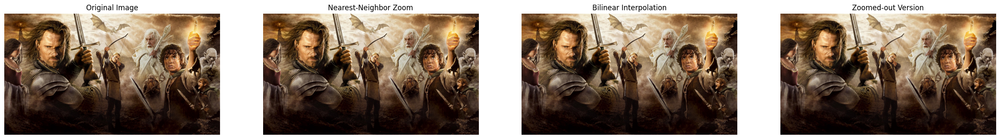

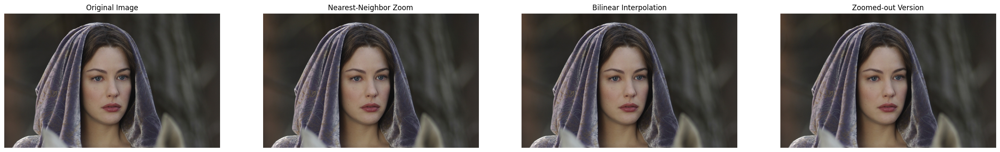

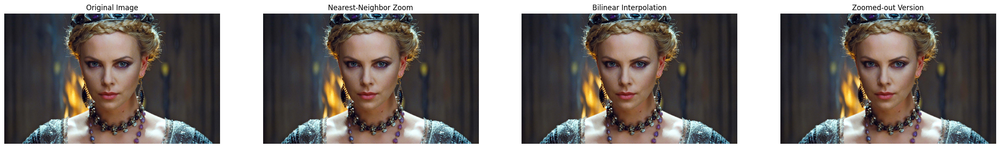

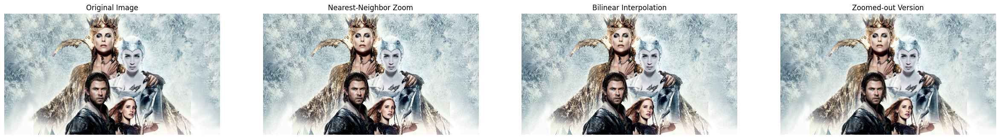

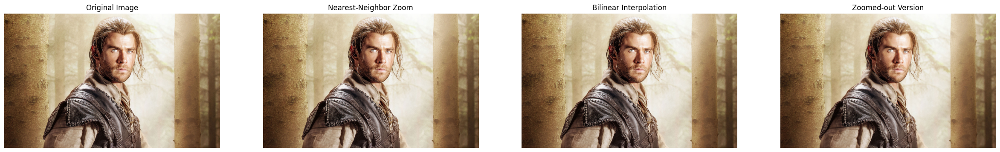

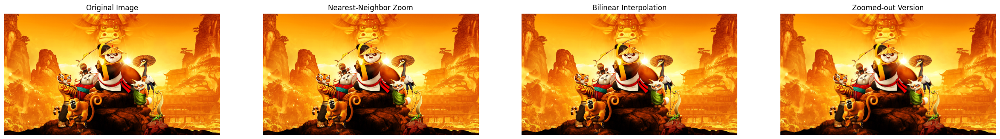

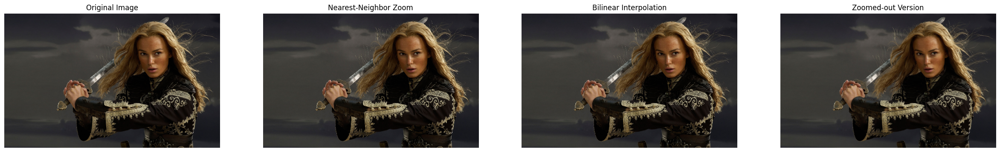

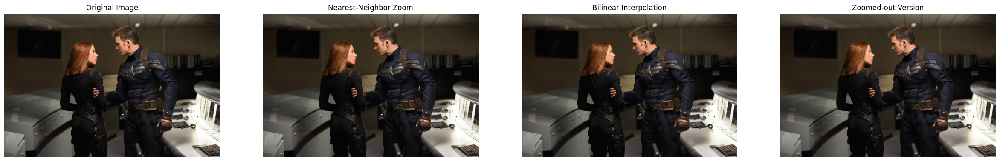

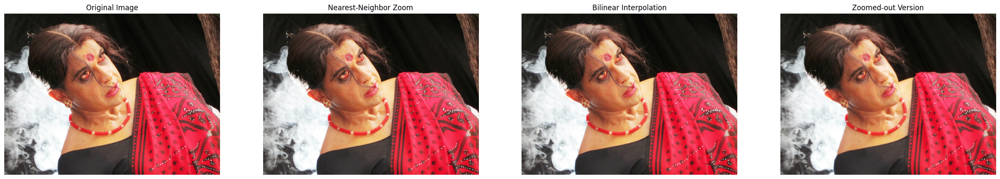

error: OpenCV(4.8.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'cv::resize'


In [11]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

zoomed_outs = ["../Assignment1_Images/im01small.png", "../Assignment1_Images/im02small.png", "../Assignment1_Images/im03small.png","../Assignment1_Images/im04small.png", "../Assignment1_Images/im05small.png", "../Assignment1_Images/im06small.png","../Assignment1_Images/im07small.png", "../Assignment1_Images/im08small.png", "../Assignment1_Images/im09small.png","../Assignment1_Images/im010small.png", "../Assignment1_Images/im011small.png"]
originals = ["../Assignment1_Images/im01.png", "../Assignment1_Images/im02.png", "../Assignment1_Images/im03.png","../Assignment1_Images/im04.png", "../Assignment1_Images/im05.png", "../Assignment1_Images/im06.png","../Assignment1_Images/im07.png", "../Assignment1_Images/im08.png", "../Assignment1_Images/im09.png","../Assignment1_Images/im010.png", "../Assignment1_Images/im011.png"]

for i in range(10):
    img = cv.imread(originals[i])
    img1 = cv.imread(zoomed_outs[i])
    near_img = cv.resize(img, None, fx=4, fy=4, interpolation=cv.INTER_NEAREST)
    bilinear_img = cv.resize(img, None, fx=4, fy=4, interpolation=cv.INTER_LINEAR)
    
    fig, ax = plt.subplots(1, 4, figsize=(30, 5))
    ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax[0].set_title("Original Image")
    ax[1].imshow(cv.cvtColor(near_img, cv.COLOR_BGR2RGB))
    ax[1].set_title("Nearest-Neighbor Zoom")
    ax[2].imshow(cv.cvtColor(bilinear_img, cv.COLOR_BGR2RGB))
    ax[2].set_title("Bilinear Interpolation")
    ax[3].imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
    ax[3].set_title("Zoomed-out Version")
    
    for axis in ax:
        axis.axis('off')
    
    plt.show()

In [13]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

zoomed_outs = ["../Assignment1_Images/im01small.png", "../Assignment1_Images/im02small.png", "../Assignment1_Images/im03small.png","../Assignment1_Images/im04small.png", "../Assignment1_Images/im05small.png", "../Assignment1_Images/im06small.png","../Assignment1_Images/im07small.png", "../Assignment1_Images/im08small.png", "../Assignment1_Images/im09small.png","../Assignment1_Images/im010small.png", "../Assignment1_Images/im011small.png"]
originals = ["../Assignment1_Images/im01.png", "../Assignment1_Images/im02.png", "../Assignment1_Images/im03.png","../Assignment1_Images/im04.png", "../Assignment1_Images/im05.png", "../Assignment1_Images/im06.png","../Assignment1_Images/im07.png", "../Assignment1_Images/im08.png", "../Assignment1_Images/im09.png","../Assignment1_Images/im010.png", "../Assignment1_Images/im011.png"]

for i in range(10):
    img = cv.imread(originals[i])
    img1 = cv.imread(zoomed_outs[i])
    near_img = cv.resize(img, None, fx=4, fy=4, interpolation=cv.INTER_NEAREST)
    bilinear_img = cv.resize(img, None, fx=4, fy=4, interpolation=cv.INTER_LINEAR)

    cv.imshow('Original Image', img)
    cv.waitKey(0)
    cv.destroyAllWindows()

    cv.imshow('Zoomed-out Version', img1)
    cv.waitKey(0)
    cv.destroyAllWindows()

    cv.imshow('Nearest-Neighbor Zoom', near_img)
    cv.waitKey(0)
    cv.destroyAllWindows()

    cv.imshow('Bilinear Interpolation', bilinear_img)
    cv.waitKey(0)
    cv.destroyAllWindows()


error: OpenCV(4.8.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'cv::resize'
